In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import sys
sys.path.append('/ships19/cloud/scratch/cphillips/utility/')
import make_gif

In [219]:
import warnings

In [3]:
import xarray as xr

In [4]:
import cartopy.crs as ccrs

In [23]:
from tqdm import tqdm

In [5]:
from pathlib import Path

In [10]:
sys.path.append('../')
import find_files

In [11]:
ROOT = Path('../final/2022/202201/20220115/')

In [187]:
files_11 = sorted(ROOT.rglob('*refl_00_65um_2*'))[:20]
files_11 = sorted(ROOT.rglob('*temp_11_00um_2*'))[:20]
files_67 = sorted(ROOT.rglob('*temp_06_70um_2*'))[:25]
files_73 = sorted(ROOT.rglob('*temp_07_30um_2*'))[:30]

#files_11 = sorted(ROOT.rglob('*temp_03_80um_2*'))[:20]

In [196]:
wmo_id = xr.open_dataset(next(ROOT.rglob('*wmo*'))).wmo_id

In [198]:
wmo_id.attrs['satellite_names'].split(';')

['152=GOES-16',
 '664=GOES-17',
 '167=Himawari-8',
 '684=Meteosat-8',
 '305=Meteosat-11']

In [218]:
not_g17 = ((wmo_id != 664) & (wmo_id != 0))

In [224]:
video = Path('volcano.gif')
with make_gif.make_video(video, framerate=4) as vid:
    with tqdm(zip(files_73[4:],files_73[5:])) as bar:
        for g1,g2 in bar:
            fig = figure(figsize=(10,10), facecolor=(1,1,1,1))
            #ds1 = xr.open_dataset(f1)
            #ds2 = xr.open_dataset(f2)
            ds3 = xr.open_dataset(g1)
            ds4 = xr.open_dataset(g2)
            #ds = (ds2.temp_06_70um[0,0,::5,::5]-ds1.temp_06_70um[0,0,::5,::5])#.mean(dim='layer')
            #ds = (ds2.temp_06_70um[0,:,::,::]-ds1.temp_06_70um[0,:,::,::]).coarsen(latitude=10,longitude=10).mean(skipna=False).mean(dim='layer')
            d1 = ds3.temp_07_30um
            d2 = ds4.temp_07_30um
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                ds = (d1-d2).where(not_g17.values)[0].mean(dim='layer').coarsen(latitude=10,longitude=10).mean(skipna=False)#.mean(dim='layer')
            #ds = (ds2.temp_07_30um[0,0,::,::]-ds1.temp_07_30um[0,0,::,::]).coarsen(latitude=10,longitude=10).median(skipna=False) #.mean(dim='layer')
            ax = axes(projection=ccrs.LambertAzimuthalEqualArea(central_longitude=-175, central_latitude=-20))
            ds.plot.imshow(vmin=-1, vmax=1, cmap='RdBu',transform=ccrs.PlateCarree(), ax=ax, add_colorbar=False)
            ax.coastlines()
        
            scatter(-175,-20, color='yellow', marker='*', s=150)
            ds.close()
            tight_layout()
            draw_all()
            make_gif.render_fast(fig, vid)
            close(fig)

25it [01:45,  4.20s/it]


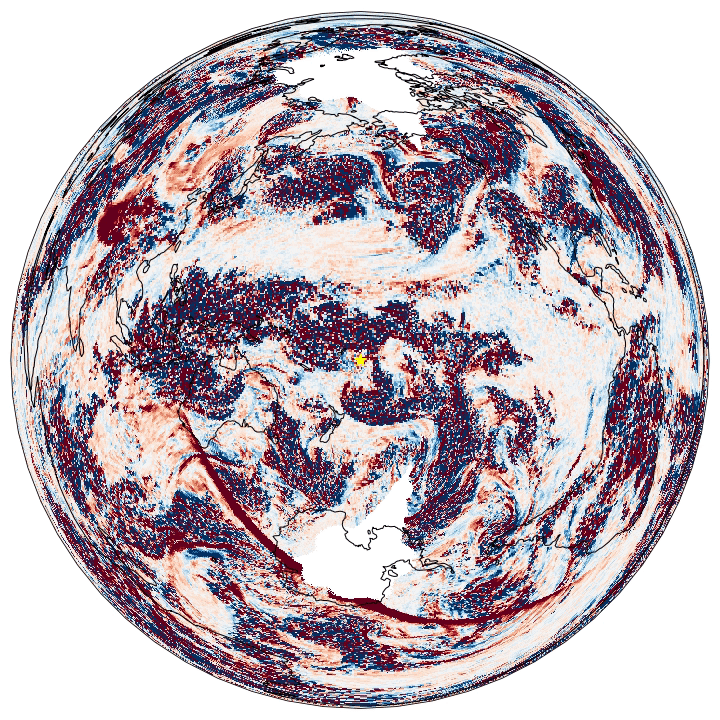

In [225]:
make_gif.play_video(video)

In [226]:
video.stat().st_size/1e6

10.128818